# Mod 4 Final Project

* Student name: Jeff Spagnola
* Student pace: Full Time 
* Scheduled project review date/time: 
* Instructor name: James Irving
* Blog post URL:

<center> <img src="dark-twitter-birdjpg.jpg" alt="Twitter Disaster" width = "700" height = "300"> </center>

## Introduction

The ability to develop a system that can accurately determine the context of a tweet can be useful in many areas, especially for organizations in the news and security sectors.  Social media outlets are increasingly becoming the primary place where news "breaks" and the ability to sift through the noise and find posts about catastropic events can lead to a much quicker response and a better concept of the details surrounding the situation. 

Within this notebook, we will create a model that can act as a social media monitor that will take in a series of tweets and determine whether or not a tweet is in reference to an actual disaster.  For example, we can use natural langauge processing to determine the difference between "There is a brush fire in Australia." and "The new Kenrick Lamar song is fire!"

### Import Packages

In [1]:
# Import numpy & tensorflow
import numpy as np
import tensorflow as tf

# Random Seed
np.random.seed(30)
tf.random.set_seed(30)

In [2]:
# The usual packages
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import string
import re

# Sklearn Stuff
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, plot_confusion_matrix, plot_roc_curve, confusion_matrix
from sklearn.metrics import recall_score

# NLP stuff
import nltk
from nltk.corpus import stopwords
from nltk import FreqDist
from nltk import word_tokenize
from gensim.models import Word2Vec
from nltk.tokenize.casual import TweetTokenizer
from nltk.collocations import BigramAssocMeasures, BigramCollocationFinder


# Keras Stuff
from tensorflow import keras
from keras.preprocessing.text import Tokenizer
from keras.preprocessing import text, sequence
from keras.utils import to_categorical
from tensorflow.keras.layers import Dense, LSTM, Embedding, SpatialDropout1D, Dropout
from tensorflow.keras.layers import Bidirectional, LeakyReLU
from tensorflow.keras.models import Sequential
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping

Using TensorFlow backend.


### Functions

In [3]:
# Dataframe Info

def import_csv(csv):
    """I don't know why I made this, but it takes in the csv file name and returns a dataframe."""
    df = pd.read_csv(csv)
    return df

def get_df_info(df):
    '''Simple function that takes in a dataframe and returns some basic info.'''
    print(df.shape)
    print(df.info())
    print(df.isna().sum())
    
def get_columns_with_nulls(df):
    '''Iterates through a dataframe and pulls out the columns with null values, 
    as well as the amount of null values in the column.'''
    
    print("Columns with Null Values")
    print("-------------------------")
    for column in df.columns:
        if df[column].isna().sum() > 0:
            print(column, ' = ', df[column].isna().sum())
            
# Plotting
            
def count_plot(df, column):
    '''Plots a countplot after taking in a dataframe and column.'''
    
    # Setting style for plots
    sns.set_style('darkgrid')
    sns.set(font_scale = 1.25)

    # Plotting barplot
    ax = plt.figure(figsize = (12, 6))
    ax = sns.countplot(data = df, x = column)
    ax.set_title('Number of Attacks by {}'.format(column.split('_')[0].title()))
    ax.set_xlabel(column.split('_')[0].title())
    ax.set_ylabel('Count')
    plt.xticks(rotation = 90);
    
def barplot(data, x, y, title, xlabel, ylabel):
    ''' Plots a simple, customized seaborn barplot'''
    
    plt.figure(figsize = (18, 8))
    sns.barplot(data = data, x = x, y = y)
    plt.title(title, fontsize = 20)
    plt.xlabel(xlabel, fontsize = 16)
    plt.ylabel(ylabel, fontsize = 16)
    plt.xticks(rotation = 45, fontsize = 12, ha = 'right') 
    plt.show();

# Evaluating Models

def evaluate_classifier(model, X_test, y_test):
    '''Evaluates a classification model by displaying a classification report, 
    a confusion matrix plot, and a ROC-AUC plot.'''
    
    # Predictions
    y_hat_test = model.predict(X_test)
      
    # Classification Report
    print('                 Classification Report')
    print('-------------------------------------------------------')
    print(classification_report(y_test, y_hat_test))
    
    # Confusion Matrix Plot
    fig, axes = plt.subplots(figsize = (12, 6), ncols = 2)
    plot_confusion_matrix(model, X_test, y_test, normalize = 'true', cmap = 'Blues', ax = axes[0])
    axes[0].set_title('Confusion Matrix');
    
    # ROC-AUC Curve
    roc__auc_plot = plot_roc_curve(model, X_test, y_test,ax=axes[1])
    axes[1].legend()
    axes[1].plot([0,1],[0,1],ls=':')
    axes[1].grid()
    axes[1].set_title('ROC-AUC Plot') 
    fig.tight_layout()
    plt.show()
    
def network_eval_plots(results):
    '''Visualizes the loss and accuracy of the training set and validation set'''
    
    history = results.history
    plt.figure()
    plt.plot(history['val_loss'])
    plt.plot(history['loss'])
    plt.legend(['val_loss', 'loss'])
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.show()
    
    plt.figure()
    plt.plot(history['val_acc'])
    plt.plot(history['acc'])
    plt.legend(['val_acc', 'acc'])
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.show()
    
def nn_confusion_matrix(y_test, preds):
    '''Creates a confusion matrix specifically for neural networks.'''
    cm = confusion_matrix(y_test, preds, normalize = 'true')
    ax = plt.figure(figsize = (6,6))
    ax = sns.heatmap(cm, cmap = 'Blues', annot = True)
    ax.set_ylim([0,2])

def evaluate_network(results, model, X_test, y_test):
    preds = model.predict(X_test).round()
    print('                 Model Evaluation')
    print('-------------------------------------------------------')
    print(model.evaluate(X_test, y_test))
    print(' ')
    print('                 Loss & Accuracy Curves')
    print('-------------------------------------------------------')
    network_eval_plots(results)
    print(' ')
    print('                 Classification Report')
    print('-------------------------------------------------------')
    print(classification_report(y_test, preds))
    print(' ')    
    print('                 Confusion Matrix')
    print('-------------------------------------------------------')
    nn_confusion_matrix(y_test, preds)
    
# Cleaning Text

def remove_url(text):
    '''Takes in block of text and returns it without url'''
    url = re.compile(r"https?://\S+|www\.\S+")
    return url.sub(r"", text)

def remove_html(text):
    '''Takes in a block of text and removes any html'''
    html = re.compile(r"<.*?>")
    return html.sub(r"", text)
    
def remove_emoji(string):
    '''Takes in a string and removes any emojis or other symbols'''
    emoji_pattern = re.compile(pattern = 
        "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        "]+",
        flags = re.UNICODE
    )
    return emoji_pattern.sub(r"", string)

def remove_punctuation(text):
    ''' Removes punctuation'''
    table = str.maketrans("", "", string.punctuation)
    return text.translate(table)

def remove_stopwords(text):
    stop = set(stopwords.words('english'))
    text = [word.lower() for word in text.split() if word.lower() not in stop]
    
    return " ".join(text)

def get_recall(model, X_test, y_test):
    '''Prints the recall score for a model.'''
    
    # Predictions
    y_hat_test = model.predict(X_test)
    
    # Get Recall Sore
    recall = recall_score(y_test, y_hat_test)
    return recall

## Obtain

 <div class="alert alert-info" role="alert">
The data was obtained from the <a href="https://www.kaggle.com/vstepanenko/disaster-tweets">Disaster Tweets dataset on Kaggle</a>.  The dataset contains over 11,000 tweets associated with disaster keywords such as "crash", "quarantine", "ablaze", and others.  All tweets were collected on Jan. 14th, 2020 and some of the topics collected were the eruption of Taal Volcano in Batangas, Phillippines, Coronavirus, Bushfires in Australia, and the downing of flight PS752.  
    </div>

### Import Data

In [4]:
# Importing the dataset

df = pd.read_csv('tweets.csv')
print(df.shape)
df.head()

(11370, 5)


,id,keyword,location,text,target
0,0,ablaze,NaN,"Communal violence in Bhainsa, Telangana. ""Ston...",1
1,1,ablaze,NaN,Telangana: Section 144 has been imposed in Bha...,1
2,2,ablaze,New York City,Arsonist sets cars ablaze at dealership https:...,1
3,3,ablaze,"Morgantown, WV",Arsonist sets cars ablaze at dealership https:...,1
4,4,ablaze,NaN,"""Lord Jesus, your love brings freedom and pard...",0


> Target = 1 for actual disaster, 0 for non-disaster. 

In [5]:
# Getting basic info on the dataframe

get_df_info(df)

(11370, 5)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11370 entries, 0 to 11369
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        11370 non-null  int64 
 1   keyword   11370 non-null  object
 2   location  7952 non-null   object
 3   text      11370 non-null  object
 4   target    11370 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 444.3+ KB
None
id             0
keyword        0
location    3418
text           0
target         0
dtype: int64


In [6]:
# ID column is unneceassry so we can drop it

df.drop('id', axis = 1, inplace = True)
print(df.shape)
df.head()

(11370, 4)


,keyword,location,text,target
0,ablaze,NaN,"Communal violence in Bhainsa, Telangana. ""Ston...",1
1,ablaze,NaN,Telangana: Section 144 has been imposed in Bha...,1
2,ablaze,New York City,Arsonist sets cars ablaze at dealership https:...,1
3,ablaze,"Morgantown, WV",Arsonist sets cars ablaze at dealership https:...,1
4,ablaze,NaN,"""Lord Jesus, your love brings freedom and pard...",0


 <div class="alert alert-info" role="alert">
Full dataset is 4 columns and 11,370 rows.  Lots of null values within the location column and the text column is super messy.  
    </div>

## Scrub

### Explore the Data

In [7]:
# Refresh our memory on the amount of null values and the unique values

print('The Number of Nulls in this column:', df['location'].isna().sum())
print('The Unique Value Counts in this column:', df['location'].value_counts().unique().sum())

The Number of Nulls in this column: 3418
The Unique Value Counts in this column: 1227


In [8]:
# Get value counts for location column 

df['location'].value_counts()

United States      96
Australia          83
London, England    81
UK                 77
India              74
                   ..
Destin, FL          1
Terra               1
Belgaum, India      1
Carshalton          1
shell city          1
Name: location, Length: 4504, dtype: int64

In [9]:
# Let's see what all the values are

for i in df['location']:
    print(i)

nan
nan
New York City
Morgantown, WV
nan
OC
London, England
Bharat
Accra, Ghana
Searching
nan
nan
nan
HYDERABAD
Reno, NV
nan
nan
nan
Worldwide
nan
nan
nan
Italy
` ˗ˏˋ i'm⠀waiting⠀for⠀you⠀to⠀pour⠀my⠀𝘀𝗶𝗻𝘀⠀onto⠀me⠀;⠀call⠀me⠀your⠀𝘭𝘰𝘷𝘦𝘳⠀whispering⠀hymns⠀to⠀my⠀ear⠀,⠀crucify⠀me⠀in⠀claims⠀of⠀praising⠀me .
Okielahoma
nan
nan
Havana 3am
nan
nan
nan
Washington, DC
India
Salta, Argentina
Wherever socks go in the dryer
Kuala Lumpur
nan
Sydney, New South Wales
Nigeria
Davanagere, India 
Lyndhurst, OH
Covina, Ca
Colorado, Brighton
nan
North Carolina, USA
kurger bing
Faridabad, India
60
ngovhela Mahunguni
nan
Germany
South Beach, FL
London, United Kingdom
Phoenix, AZ 85017
England, UK 
Melbourne, Australia
Pearland, TX
Africa
California, USA
nan
Kerala, India
Staffordshire,England
nan
Port Harcourt, Nigeria
nan
Everywhere
Ann Arbor, MI
Global
Puerto Rico, USA
In the mind of haters.
Czech Republic
USA
nan
Bay Area, CA
Great Southwest, U.S.A.
Katowice, Poland
nan
Toronto
Texas
são paulo -sp
  Philippine

Planet Earth
The Lone Star State
Montreal, Canada
North Carolina, USA
Philadelphia PA
Constitutionalist in the South
Among The Human Race
Cornwall
nan
U.S.A.
Fairfield, OH
nan
nan
Destin, FL
The Land Of The Free Because Of The Brave USA
nan
nan
Washington, D.C.
Toronto, Canada
United States of⚡️🧠+#Trump5G
Land known as Australia
Baltimore, Maryland
London, Oxford & Hay-On-Wye
Committed to those who sacrificed for what America truly should be, not what Trump is making it.
Committed to those who sacrificed for what America truly should be, not what Trump is making it.
nan
it
Sirius
Santa Barbara, CA
St. Louis
Caribbean
Manchester, England
UK- Wales
Dun Laoghaire
ÜT: 45.290968,-92.376844
United States
Milano, Lombardia
United States
Toronto, Canada
Concord
Morally Grey opinion & thought
nan
nan
nan
Oregon, Australia and Hawaii
nan
MX-TX-TN-CA-MI-IN-GA
Grodno, Belarus
Cornwall
nan
Des Moines
USA
ateneo
nan
Maldives
Maldives
Maldives
Zhanjiang, Guangdong, China
Washington,DC
nan
Maldives
Sw

nan
Paris, FR
nan
Japan
nan
Bellarine Peninsula, Victoria
🇰🇼 🇵🇭
Kingdom of Saudi Arabia
Cape Town, South Africa
Ballina nsw australia
nan
Hindustan
nan
nan
Melbourne, Victoria
Brisbane, Queensland
On the road again
nan
nan
towards The Center
nan
nan
au
ALP Being Exposed
England, United Kingdom
Port Harcourt
nan
nan
au
den
Paris, France
Bath, Somerset
Islamic Republic of Iran
nan
Texas, USA
Finland
San Diego, CA
Melbourne, Australia
nan
Planet Earth
she/her
she/her
Kuala Lumpur City, Kuala Lumpu
nan
Wide Bay Region QLD
nan
Louth Lincolnshire
Nairobi, Kenya
nan
India
new pin later
Brisbane, Queensland
nan
Bay Area, CA
Hyderabad, India
nan
nan
nan
nan
nan
Nairobi, Kenya
nan
South Australia
BOM-BLR-GNZ-DEL.
Nationwide
nan
nan
South Africa
Penultimate page of The Lorax
nan
nan
War 666
San Antonio, TX
Winston-Salem, NC
Limerick, Ireland
Vancouver
Wandsworth, London
Indraprastha
Outback Oz
nan
Alpharetta GA
The Web
nan
Watching sakura on Drum Island
Cambridgeshire, UK
Lithuania
Beirut, Lebano

Sussex UK
Greater Manchester
Terrassa, República catalana
nan
South Carolina, USA
Brighton, England
Bangor, Wales
Dublin, Ireland
North Wales, UK
London, England
United Kingdom
Ireland
Isle of Man
Faridabad, India
Isle of Man
Ireland
North West, England
nan
Ireland
Garmisch-Partenkirchen, Germany
nan
Cortland Area, NY
Manor park
Isle of Man
Inishowen
Ireland
Motherboard
Lancashire
nan
Monasterevin Co Kildare
nan
nan
#bAdGB #cali
Scotland, United Kingdom
Gujarat, India
nan
Ireland
Cambridge, UK
South East, England
nan
Brighton, UK
Brighton, Sussex, UK
South East, England
The Wirral and Londonistan.
nan
South East, England
East, England
North Carolina
चेनासमुद्रम, भारत
Ashbourne , England
Jakarta
Abuja, Nigeria
Everywhere
London, England
Russia. In the dense forests.
nan
Vancouver, Canada
Cape Cod, Massachusetts USA
MAGA Country
Cape Cod, Massachusetts USA
Cape Cod, Massachusetts USA
nan
nan
UB, Mongolia
Sydney, New South Wales
Georgia, USA
Maryhill & Springburn Scotland
nan
Nigeria
USA


Bhubaneshwar, Odisha, India
Surulere, Lagos
they/them !!
Lincs/Leics
Hope World
Mumbai, India
Kerala, India
nan
60.855423, -0.885393
nan
Earth
New Delhi
nan
Goole, England
Ohio, USA
Liverpool, England
Patna, India
Canada
nan
nan
Ibadan, Nigeria
nan
沼の中
somewhere
Port Harcourt, Nigeria
Kent UK
Milky Way Galaxy
nan
Goole
Milan (Italy)
  Shinjuku-ku, Tokyo,  Japan
nan
Punjab, Pakistan
Auckland Park, Johannesburg
Ashton-under-Lyne, England
nan
Anamnagar, Kathmandu, Nepal
Machilipatnam, India
nan
Mumbai
London
nan
Global
Bengaluru, India
Lynchistan
Kolar, dist karnataka ,India .
Pune, India
Nola•Houston | 🇨🇴
Edinburgh, Scotland
nan
australia
United States
Norfolk etc..
Nepal
London
Observation drone
nan
London, England
Yes i succ toes 6969
Port Elizabeth, South Africa
nan
The European Union.
Fully mobile
𝙶𝚘𝚍'𝚜 𝚐𝚛𝚊𝚌𝚎
Kotli Azad Kashmir
Zurich, Switzerland
au;multiverse - fantasy ocrp.
Bengaluru, India
Canberra, Australia
Aryavarta
Kerala
Caprica
Pallakad, India
Wirral/Merseyside
Leeds, Engla

nan
Ibadan, Nigeria
Minnesota
Africa
Port Harcourt, Nigeria
Manchester🇬🇧 UK
Mafikeng, South Africa
TF2 Heavy's Urethra
Lusaka, Zambia
nan
1200-1500
nan
nan
nan
Lagos Nigeria
Bigfoots Bluff
London
Crystal Lake, FL
nan
Cheshire, England
1200-1500
Whakatane District, New Zealan
Pretoria, South Africa
nan
SD/TJ
mystic falls.
Asgard
nan
Grange, Adelaide Australia
Canada
alger
nan
Connecticut, USA
nan
nan
nan
nan
nan
nan
nan
nan
nan
Scottish highlands
nan
Coastal Maine
England, United Kingdom
sweden
too many to mention
nan
Felsted in Essex
nan
nan
Cairo
Cork, Ireland
nan
St. Louis
Dublin City, Ireland
Tillamook, OR
nan
Iowa City, IA
DAMMAM
nan
Houston, TX
Mombasa Kenya
Lahore. Los Angeles.
Europe
she/her
Federal Way, WA
South Africa
Lagos, Nigeria
Barcelona, España
nan
nan
M.I.A
IM A MULTISHIPPER
Singapore
Hong Kong
nan
nan
Massachusetts, USA
Bangalore
jjk1 🇬🇷
Alberta, Canada
Australia
nan
nan
Twin Peaks, WA
thehuns ⋆ thexo
𝘿𝘼𝙍𝙆𝙉𝙀𝙎𝙎
nan
New York, NY
nan
CALIFORNIA
Everywhere
United Kingdom
B

Southampton
nan
Winterfell
Winner
Philippines
Alabang, Muntinlupa City
Pasig City, Philippines
ig: alcalafaye
San Jose, CA
An Australian increasingly more concerned about democracy in Australia.
𝒇𝒓𝒂𝒏𝒄𝒐
 Mother of BBIBBI "Philiphili"
nan
nan
𝒇𝒓𝒂𝒏𝒄𝒐
misplaced
Philippines
Republic of the Philippines
Plymouth
Sta Rosa ,Laguna Philippines
National Capital Region
nan
nan
nan
choice•alice•stay•atiny•carat
bttm!jm•jin•hope+top!v
Lagos, Nigeria
Putney London England UK
nan
18 she/her was fuushiguro
Joon Republic
nan
nan
Twin Peaks
nan
nan
nan
nan
Arizona, USA
Echo Creek
In your fridge
Katowice, Polska
♡ALLAH&RASUL♡
nan
nan
i：pixiv id 20953077
South Africa
DKI Jakarta, Indonesia
nan
𝚜𝚗𝚊𝚙: 𝚏𝚕𝚘𝚘𝚌𝚞𝚛𝚊
East Coast
nan
nan
Johannesburg, South Africa
nan
nan
nan
nan
nan
⚜
nan
Nigeria
Hong Kong
nan
Autobot City, Earth
Manchester, England
nan
nan
Kenol Makutano.
nan
Pequod bound round the world
nan
Cocagne,NB
Dubai
Africa🌏
Tokyo, Japan
IndieGameGuysPromo@gmail.com
London
THEY/THEM or HE/HIM
Perak, Malaysi

San Antonio, TX
Mississippi, USA
Oxford, MS
Memphis, TN
Memphis, Tennessee, USA
Jackson Mississippi
Pontianak, Kalimantan Barat.
Hell
Paris, France
nan
Wake County, North Carolina
Quezon City, Philippines
Melbourne, Victoria
Scotland
nan
nan
Lafayette ↔️ Baton Rouge
London UK
Weener
Lothian
Surrey, UK
Kenya
not in a vote remain area
nan
North East, England
richmond virginia
Bronx, NY— Richmond, VA
nan
Shreveport to BR
nan
England
Europe
UK
Queens
Yorkshire
nan
Hobart, Tasmania
National Helpline 03457114141
Chandigarh, India
🔮
Planet Earth
Manila
UK
Little corner of Glos...
nan
Brussels, Belgium
Abuja
Baltimore City
nan
nan
nan
nan
nan
USA
USA
UK
nan
nan
nan
Oxfordshire
nan
Earth
Ballycastle
nan
Spain
Melbourne, Victoria
southampton
Dover, England
Malacca, Malaysia
nan
#WMCA but wanting OUT
Karachi , Pakistan
Madrid, España
Rawalpindi, Pakistan
North Africa,West/Central Asia
Kent, UK
Kent, UK
Madrid, España
Suffolk, Essex & Cambs
Herefordshire & Worcestershire
Satan’s asshole
Dublin, Ir

nan


Charleston, WV
nan
nan
nan
Goa, India
Atlanta, GA 770-578-2344
LA, CA, USA
where we park it
nan
nan
South Africa
nan
Lagos
Baltimore/Nashville
Johannesburg,South Africa 🇿🇦
India
nan
London, UK
nan
European Union E U
In witness protection
nan
Bombay
Punjab, Pakistan
Mumbai, India
nan
nan
nan
Kolkata, India
Manila City
Canterbury Cathedral
nan
INDONESIA
London, England
World wide
Small Island Pacific Northwest
he / him
Canterbury Cathedral
California, USA
Kolkata, India
Lagos Nigeria
California, USA
nan
Milwaukee, WI
🦶🏽ORLANDO_SOWETO 🦶🏽
Mumbai, India
Oxford, England
آداب
Santa Fe, New Mexico
nan
新潟県三条市
In between a Home & a Homeland
Durban, Occupied Azania
Centurion, South Africa
Torbay, England
nan
nan
Africa🌏
nmsu 🤠
Indiana, USA
Mumbai, India
nan
England, United Kingdom
hara’s forehead
In the clouds
California & Nevada
Hiding in a red state
Ethiopia
North West, England
nan
nan
jollibee
Việt Nam
nan
Hiding in a red state
philadelphia, pa
nan
Cambridge, UK
nan
Manchester, England
H

Berlin
nan
pshs-evc x upd dieor
Beeston, Nottingham, UK
nan
Illinois, USA
Eugene,OR. USA
Lancashire
nan
Lothian
nan
Egypt
Kota Langsa
Nairobi, Kenya
nan
nan
nan
Lagos, Nigeria
South of FRANCE
RASTAMAN VIBRATION POSITIVE
nan
Illinois, USA
nan
nan
St Lucia
nan
Philippines
Brussels, Belgium
nan
nan
nan
Baghdad, Iraq
nan
Freedom
nan
nan
東京都 練馬区
nan
nan
Down to Earth
Metro Atlanta
Kushville💀
nan
nan
England, United Kingdom
{ FAN ACCOUNT }
NOT FOUND
Sandomierz PL
Africa
Honolulu, HI 
Missoula, MT
nan
nan
Florida 🏖
Hawaii state
Tokyo, Japan
He/Him
Tucson, AZ
Kenosha
nan
nan
nan
17331
Earth
La Cañada, California
nan
Ramallah
nan
nan
United States
nan
ATX
nan
Niagara Falls, NY
nan
Angers, France
Washington, USA
The Netherlands
Snohomish County, Washington
Boston, MA
Pi⚜️⚜️sburgh, Penns🕊lvania
nan
nan
North Carolina, USA
nan
UP Diliman
Minnesota, USA
Somewhere RED!!!!IFBAP
Geffen
bottom of the sea
Philippines
earth
nan
Cebu
nan
Kampala, Uganda
Herrliberg, Schweiz
Nairobi
Kenilworth
Central Coast

nan
somewhere n Washington
NYC
nan
nan
nan
California, USA
nan
Salem, OR
Washington, DC
Pakenham, Victora, Australia
United States
Near you
nan
Green Bay, WI, USA
Austin, Texas
Dallas, Texas
Kochi / Pune
Staffordshire England
nan
London, England
nan
nan
nan
am
nan
Portland, MI
Broken Hill
Somewhere in the North
East Africa
nan
Mumbai, India
India
Mumbai, India
nan
New Delhi, India
nan
nan
India
nan
वसुधैव कुटुंबकम्
Apno K DiLon Me
Attiki, Greece
nan
nan
California, USA
Gold Coast Australia
Squatting on Cadigal land
GGN & Rajasthan, India
Kitano, Kobe City, Japan
UK
NYC
nan
nan
South Africa, Helltopia
Lewisham, London
NS-MLK
Liverpool
nan
nan
London
Gold Coast
Balesore
nan
nan
Mumbai
Herefordshire
nan
nan
nan
nan
Brighton & Hove
San Francisco, CA
Worldwide
nan
Adiedo
India
Colorado, USA
Chicago Suburbs
nan
The Indus ,Swabi Pashtunkhwa
nan
nan
Kenya
🌍
United States
nan
dance, dance, with me!
Formerly FATA, Balochistan via Karachi, and definitely Pakistan
Lebanon
nan
Huddersfield, England

nan
On A Quest For Tanelorn
nan
Scotland, United Kingdom
Oklahoma City
Barcelona
Barcelona, España
nan
Los Angeles
nan
Cirencester, England
UK
엑소
The eye of the Universe
Cincinnati
nan
⇨
nan
UK
UK
Holly, MI
UK
Wellington City, New Zealand
nan
UK
UK
nan
UK
Dublin
Persona 5 Royal Waiting Room
nan
UK
Texas
Manhattan, NY
moon
jikook & txt
nan
UK
UK
UK
THE GREATER HOUSTON AREA
nan
UK
Southampton
UK
nan
nan
Polska
Pomona, CA
nan
UK
Jozi City Lights
New York, NY
Mex / she-her × 23 | BTS only
nan
California, USA
London, England
New York, NY
UK
UK
nan
nan
UK
nan
nan
Malaysia
nan
nan
Malaysia
Rainy ol' Scotland!
nan
Hobart, Australia
New Forest
India
wherever there is injustice
nan
nan
I dont know where i am. Help.
cedar farm gallery, mawdesley
London, England
Kyoto, Japan
An Australian increasingly more concerned about democracy in Australia.
Tweets are my own and not representative of my employer
Sydney, New South Wales
Sydney, Australia
Sydney
nan
nan
Brisbane
nan
Rogue seal capital, Tasmania

nan
nan
ประเทศไทย
nan
nan
Nigeria
nan
Godalming, England
nan
Virginia
Pluto
Australia
Charlotte
Norfolk, VA
Mumbai, India
USA
Virginia
💙💘💜
CisHet: She/Her, Heavy ReTweeter
Blacksburg, VA
nan
USA
Piedmont of North Carolina
nan
Shelbyville, TN
New Delhi, India
New Delhi, India
New Delhi, India
New Delhi, India
nan
Bergen, Norway
nan
nan
United States
United States
United States
United States
Raleigh, NC
Queensland, Australia
Lynchburg, VA
nan
subspace rift
nan
nan
Arlington Heights-Chicagoland
Norfolk, VA
North Carolina
USA
nan
Incheon, South Korea
Wakefield, VA
Wakefield, VA
nan
nan
nan
nan
nan
nan
Danville, VA, USA
nan
Exploring
nan
nan
atl•nola•nsh
nan
Atlanta, GA
Atlanta, GA
Atlanta, GA
Atlanta, GA
Atlanta, GA
Atlanta, GA
Atlanta, GA
Atlanta, GA
Atlanta, GA
Atlanta, GA
Atlanta, GA
Atlanta, GA
Atlanta, GA
nan
Hawaii, USA
Columbus, MS
Mississippi
USA
Perth, Western Australia
Jackson, MS
Louisiana, USA
nan
Sioux Falls, SD
Sioux Falls, SD
Sioux Falls, SD
Sioux Falls, SD
Sioux Falls, SD
S

Multan, Pakistan
Entebbe
Κεντρική Μακεδονία, Ελλάς
Berlin
Masvingo, Zimbabwe
Victoria, Australia
Drinking tea somewhere x
nan
nan
nan
nan
Fairhope, Alabama
Naucalpan de Juárez, México
nan
Red Faction
You on a need to know basis
Red Faction
Jakarta, Indonesia
भारत
nan
Maiduguri, Nigeria
Ontario
Italia
nan
Tokoroa, New Zealand
nan
Texas, USA
nan
nan
Tamriel — #Tsᴜʙ
nan
my name is Mia not khalifa
New England
nan
Uttar Pradesh, Mumbai, India
nan
Wamego, KS
Baltimore, MD
nan
nan
nan
Scotland, United Kingdom
Austin, TX
San Diego, CA
Instagram/MattEliteStorm
Nationwide
nan
Georgia
MS🛫🛬SoCal
En el borde de todo
Country ONG
nan
nan
Kaunas, Lithuania
nan
Michigan, Earth
Oulu, Suomi
Lagos
Caketin
nan
nan
Missouri, USA
nan
United States
nan
nan
nan
Canuckistan
nan
Fort Drum, NY
Khi/NYC
nan
MY EVIL LAIR
nan
Las Vegas, NV
Iran
The Netherlands
hueco mondo
Dorset, England, UK
nan
Mparntwe NT Australia
nan
Berkeley, CA
nan
Promised Land
nan
that one place in Kansas.
nan
Manchester, England
Switzerland


In [10]:
# Check out how many null values

df.isna().sum()

keyword        0
location    3418
text           0
target         0
dtype: int64

 <div class="alert alert-info" role="alert">
The location information could prove useful in the future when building more complex models, but for now let's focus on just the text and target columns
    </div>

In [11]:
# Drop location column

df = df.drop('location', axis = 1)
df.head()

,keyword,text,target
0,ablaze,"Communal violence in Bhainsa, Telangana. ""Ston...",1
1,ablaze,Telangana: Section 144 has been imposed in Bha...,1
2,ablaze,Arsonist sets cars ablaze at dealership https:...,1
3,ablaze,Arsonist sets cars ablaze at dealership https:...,1
4,ablaze,"""Lord Jesus, your love brings freedom and pard...",0


In [12]:
# Creating X and y

X = df['text'].copy()
y = df['target'].copy()

In [13]:
# Checking to see if there's any class imbalance

y.value_counts(1)

0    0.814072
1    0.185928
Name: target, dtype: float64

 <div class="alert alert-info" role="alert">
Looks as though there's a very imbalanced class here.  Will deal with this shortly. 
    </div>

### Train Test Split

In [14]:
# Creating a train/test split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 30)

print('X_train shape is', X_train.shape)
print('X_test shape is', X_test.shape)
print('y_train shape is', y_train.shape)
print('y_test shape is', y_test.shape)


X_train shape is (9096,)
X_test shape is (2274,)
y_train shape is (9096,)
y_test shape is (2274,)


In [15]:
X_train[:5]

8759    One more peep out of that country and I would ...
1136              PUBG: Provide Unmitigated Blizzard Goop
8018    me, a fool: boy do i hope warren and sanders c...
5008    Want to receive $15,000 in funding &amp; entre...
9590     Chicken shit he will get laid out stretcher time
Name: text, dtype: object

In [16]:
X_test[:5]

5843    I wish we could have a steel cage death match ...
8964    funny that no one is screaming "justice" every...
1886    Come on - the country is burning. Over a billi...
3114    Curative petitions by two of the convicts in #...
5914    our 2020 so far: 🇦🇺 Australia bushfires 🇺🇲🇮🇷 W...
Name: text, dtype: object

### Setting up Stopwords & Punctuation Removal

In [17]:
# Get list of stopwords & punctuation

stop_words_list = stopwords.words('english')
stop_words_list.extend(string.punctuation)
stop_words_list.extend(["...", '"', "'"])
stop_words_list

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

### Tokenization & Vectorization

In [18]:
# Setting up a tweet tokenizer
tokenizer = nltk.tokenize.TweetTokenizer(preserve_case = False)

# Setting up a vectorizier
vectorizer = TfidfVectorizer(tokenizer = tokenizer.tokenize, stop_words = stop_words_list)

In [19]:
y_train

8759    0
1136    0
8018    0
5008    0
9590    0
       ..
4859    0
919     0
500     0
4517    0
5925    0
Name: target, Length: 9096, dtype: int64

In [20]:
# Fit & Transform X & y data

X_train_processed = vectorizer.fit_transform(X_train)
X_test_processed = vectorizer.transform(X_test)

X_train_processed

<9096x25260 sparse matrix of type '<class 'numpy.float64'>'
	with 100767 stored elements in Compressed Sparse Row format>

In [21]:
pd.DataFrame(X_train_processed.todense())

,0,1,2,3,4,5,6,7,8,9,...,25250,25251,25252,25253,25254,25255,25256,25257,25258,25259
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9091,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9092,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9093,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9094,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### SMOTE - Commented Out

In [22]:
import six
import sys
sys.modules['sklearn.externals.six'] = six
from imblearn.over_sampling import SMOTE, ADASYN

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [23]:
# undersample = SMOTE(sampling_strategy = 0.1)
# X_train_resampled, y_train_resampled = SMOTE().fit_resample(X_train_processed, y_train) 

In [24]:
# X_train_resampled_df = pd.DataFrame(X_train_resampled)
# X_train_resampled_df[0].value_counts()

## Explore

### Modifying Dataset for Exploration

 <div class="alert alert-info" role="alert">
Since we'll be using different methods in order to explore the dataset, we'll also create a fresh processed dataset as well.
    </div>

#### Frequency Distribution & Bigrams

In [25]:
# Making a new explore variable for the text.

explore_df = df['text'].copy()
explore_text = ' '.join(explore_df)
explore_text

'Communal violence in Bhainsa, Telangana. "Stones were pelted on Muslims\' houses and some houses and vehicles were set ablaze… Telangana: Section 144 has been imposed in Bhainsa from January 13 to 15, after clash erupted between two groups on January 12. Po… Arsonist sets cars ablaze at dealership https://t.co/gOQvyJbpVI Arsonist sets cars ablaze at dealership https://t.co/0gL7NUCPlb https://t.co/u1CcBhOWh9 "Lord Jesus, your love brings freedom and pardon. Fill me with your Holy Spirit and set my heart ablaze with your l… https://t.co/VlTznnPNi8 If this child was Chinese, this tweet would have gone viral. Social media would be ablaze. SNL would have made a racist j… Several houses have been set ablaze in Ngemsibaa village, Oku sub division in the North West Region of Cameroon by… https://t.co/99uHGAzxy2 Asansol: A BJP office in Salanpur village was set ablaze last night. BJP has alleged that TMC is behind the incident. Police has b… National Security Minister, Kan Dapaah\'s side chic 

In [26]:
# Some basic regex and making all words lowercase

pattern = "([a-zA-Z]+(?:'[a-z]+)?)"
explore_tokens_raw = nltk.regexp_tokenize(explore_text, pattern)
explore_tokens = [word.lower() for word in explore_tokens_raw]
explore_tokens

['communal',
 'violence',
 'in',
 'bhainsa',
 'telangana',
 'stones',
 'were',
 'pelted',
 'on',
 'muslims',
 'houses',
 'and',
 'some',
 'houses',
 'and',
 'vehicles',
 'were',
 'set',
 'ablaze',
 'telangana',
 'section',
 'has',
 'been',
 'imposed',
 'in',
 'bhainsa',
 'from',
 'january',
 'to',
 'after',
 'clash',
 'erupted',
 'between',
 'two',
 'groups',
 'on',
 'january',
 'po',
 'arsonist',
 'sets',
 'cars',
 'ablaze',
 'at',
 'dealership',
 'https',
 't',
 'co',
 'goqvyjbpvi',
 'arsonist',
 'sets',
 'cars',
 'ablaze',
 'at',
 'dealership',
 'https',
 't',
 'co',
 'gl',
 'nucplb',
 'https',
 't',
 'co',
 'u',
 'ccbhowh',
 'lord',
 'jesus',
 'your',
 'love',
 'brings',
 'freedom',
 'and',
 'pardon',
 'fill',
 'me',
 'with',
 'your',
 'holy',
 'spirit',
 'and',
 'set',
 'my',
 'heart',
 'ablaze',
 'with',
 'your',
 'l',
 'https',
 't',
 'co',
 'vltznnpni',
 'if',
 'this',
 'child',
 'was',
 'chinese',
 'this',
 'tweet',
 'would',
 'have',
 'gone',
 'viral',
 'social',
 'media',
 '

In [27]:
# Removing stopwords, punctuation, and numbers

stop_words_list = stopwords.words('english')
stop_words_list += list(string.punctuation)
stop_words_list += ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
stop_words_list.extend(['h', 'https', 'b', 'c', 'w', 'co', 'n', 'u'])

cleaned_explore_text = [word for word in explore_tokens if word not in stop_words_list]
cleaned_explore_text

['communal',
 'violence',
 'bhainsa',
 'telangana',
 'stones',
 'pelted',
 'muslims',
 'houses',
 'houses',
 'vehicles',
 'set',
 'ablaze',
 'telangana',
 'section',
 'imposed',
 'bhainsa',
 'january',
 'clash',
 'erupted',
 'two',
 'groups',
 'january',
 'po',
 'arsonist',
 'sets',
 'cars',
 'ablaze',
 'dealership',
 'goqvyjbpvi',
 'arsonist',
 'sets',
 'cars',
 'ablaze',
 'dealership',
 'gl',
 'nucplb',
 'ccbhowh',
 'lord',
 'jesus',
 'love',
 'brings',
 'freedom',
 'pardon',
 'fill',
 'holy',
 'spirit',
 'set',
 'heart',
 'ablaze',
 'l',
 'vltznnpni',
 'child',
 'chinese',
 'tweet',
 'would',
 'gone',
 'viral',
 'social',
 'media',
 'would',
 'ablaze',
 'snl',
 'would',
 'made',
 'racist',
 'j',
 'several',
 'houses',
 'set',
 'ablaze',
 'ngemsibaa',
 'village',
 'oku',
 'sub',
 'division',
 'north',
 'west',
 'region',
 'cameroon',
 'uhgazxy',
 'asansol',
 'bjp',
 'office',
 'salanpur',
 'village',
 'set',
 'ablaze',
 'last',
 'night',
 'bjp',
 'alleged',
 'tmc',
 'behind',
 'incid

In [28]:
# Creating a Frequency Distribution and showing the top 25 most common words

explore_freq_dist = FreqDist(cleaned_explore_text)
most_common_words = explore_freq_dist.most_common(25)
most_common_words

[('amp', 604),
 ('like', 541),
 ('people', 529),
 ('one', 432),
 ('us', 321),
 ('get', 316),
 ('fire', 309),
 ('new', 277),
 ('would', 264),
 ('time', 255),
 ('know', 240),
 ('need', 229),
 ('iran', 226),
 ('first', 224),
 ('years', 211),
 ('see', 207),
 ("i'm", 203),
 ('today', 199),
 ('two', 192),
 ('still', 192),
 ('emergency', 192),
 ('think', 192),
 ('back', 191),
 ('storm', 187),
 ('man', 185)]

In [29]:
# Create a dataframe of most common words

most_common_words_dict = dict(most_common_words)
most_common_words_df = pd.DataFrame.from_dict(most_common_words_dict, orient = 'index').reset_index()
most_common_words_df['word'] = most_common_words_df['index']
most_common_words_df['count'] = most_common_words_df[0]
most_common_words_df = most_common_words_df.drop(['index', 0], axis = 1)
most_common_words_df

,word,count
0,amp,604
1,like,541
2,people,529
3,one,432
4,us,321
5,get,316
6,fire,309
7,new,277
8,would,264
9,time,255


In [30]:
# Create Bigrams
bigram_measures = nltk.collocations.BigramAssocMeasures()
explore_finder = BigramCollocationFinder.from_words(cleaned_explore_text)
explore_scored = explore_finder.score_ngrams(bigram_measures.raw_freq)

explore_scored[:25]

[(('taal', 'volcano'), 0.0007340842931274522),
 (('climate', 'change'), 0.00043876302577732776),
 (('years', 'ago'), 0.00040501202379445637),
 (('bush', 'fires'), 0.0003628232713158672),
 (('emergency', 'services'), 0.0003628232713158672),
 (('mass', 'murder'), 0.0003628232713158672),
 (('body', 'bags'), 0.00033751001982871366),
 (('puerto', 'rico'), 0.00033751001982871366),
 (('dust', 'storm'), 0.0003290722693329958),
 (('severe', 'thunderstorm'), 0.0003290722693329958),
 (('five', 'years'), 0.00032063451883727797),
 (('freight', 'train'), 0.0003121967683415601),
 (('heat', 'wave'), 0.0003121967683415601),
 (('swallows', 'bus'), 0.0003121967683415601),
 (('thunderstorm', 'warning'), 0.0003121967683415601),
 (('gove', 'heart'), 0.00029532126735012443),
 (('party', 'gove'), 0.00029532126735012443),
 (('schools', 'brace'), 0.00029532126735012443),
 (('triumphant', 'party'), 0.00029532126735012443),
 (('brace', 'five'), 0.0002868835168544066),
 (('suicide', 'bombing'), 0.00028688351685440

In [31]:
# Create Bigram Dataframe

bigram_dict = dict(explore_scored[:25])
bigram_df = pd.DataFrame.from_dict(bigram_dict, orient = 'index').reset_index()
bigram_df['bigram'] = bigram_df['index']
bigram_df['freq'] = bigram_df[0]
bigram_df = bigram_df.drop(['index', 0], axis = 1)
bigram_df

,bigram,freq
0,"(taal, volcano)",0.000734
1,"(climate, change)",0.000439
2,"(years, ago)",0.000405
3,"(bush, fires)",0.000363
4,"(emergency, services)",0.000363
5,"(mass, murder)",0.000363
6,"(body, bags)",0.000338
7,"(puerto, rico)",0.000338
8,"(dust, storm)",0.000329
9,"(severe, thunderstorm)",0.000329


#### Word2Vec

In [32]:
# # Train a Word2Vec
from gensim.models import Word2Vec

# w2v_data = df['text'].copy()
# w2v_text = ' '.join(w2v_data)
# w2v_text = [w2v_text.split()]

w2v_text = [cleaned_explore_text]

wv_model = Word2Vec(w2v_text, size = 100, window = 5, min_count = 1, workers = 4)
wv_model.train(w2v_text, total_examples = wv_model.corpus_count, epochs = 10)
wv_model

W1105 15:38:27.951225 140736163185536 base_any2vec.py:1386] under 10 jobs per worker: consider setting a smaller `batch_words' for smoother alpha decay
W1105 15:38:27.952410 140736163185536 base_any2vec.py:1182] Effective 'alpha' higher than previous training cycles
W1105 15:38:28.224408 140736163185536 base_any2vec.py:1386] under 10 jobs per worker: consider setting a smaller `batch_words' for smoother alpha decay


In [33]:
# Checking out the list

w2v_text

[['communal',
  'violence',
  'bhainsa',
  'telangana',
  'stones',
  'pelted',
  'muslims',
  'houses',
  'houses',
  'vehicles',
  'set',
  'ablaze',
  'telangana',
  'section',
  'imposed',
  'bhainsa',
  'january',
  'clash',
  'erupted',
  'two',
  'groups',
  'january',
  'po',
  'arsonist',
  'sets',
  'cars',
  'ablaze',
  'dealership',
  'goqvyjbpvi',
  'arsonist',
  'sets',
  'cars',
  'ablaze',
  'dealership',
  'gl',
  'nucplb',
  'ccbhowh',
  'lord',
  'jesus',
  'love',
  'brings',
  'freedom',
  'pardon',
  'fill',
  'holy',
  'spirit',
  'set',
  'heart',
  'ablaze',
  'l',
  'vltznnpni',
  'child',
  'chinese',
  'tweet',
  'would',
  'gone',
  'viral',
  'social',
  'media',
  'would',
  'ablaze',
  'snl',
  'would',
  'made',
  'racist',
  'j',
  'several',
  'houses',
  'set',
  'ablaze',
  'ngemsibaa',
  'village',
  'oku',
  'sub',
  'division',
  'north',
  'west',
  'region',
  'cameroon',
  'uhgazxy',
  'asansol',
  'bjp',
  'office',
  'salanpur',
  'village',

In [34]:
# Let's see a the weights of a random word

wv_model['communal']

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


array([-1.3433428e-03, -1.1554043e-03, -1.5598019e-03,  3.2829177e-03,
        3.3046645e-03,  1.7747344e-04, -2.2918910e-03,  1.2196150e-03,
        1.4566131e-03,  2.8537018e-03,  3.0200256e-03, -4.3231463e-03,
       -1.8302267e-03, -7.1642350e-04, -4.7975173e-03, -2.5807196e-05,
        3.8380628e-03,  2.8377317e-03,  3.7432311e-04, -5.9125712e-04,
        3.3086997e-03, -2.4722547e-03,  1.9780597e-04,  4.7237356e-03,
       -3.3236777e-03,  5.7727337e-04,  2.0151532e-03, -4.7646623e-04,
        3.2094645e-03, -3.2026055e-03, -1.1679163e-03, -3.4148842e-03,
       -2.1506846e-03, -3.5075869e-03,  3.5929724e-03, -1.2220917e-03,
       -3.3882619e-03, -5.0886343e-03, -4.3589589e-03,  3.1123564e-03,
        4.6286322e-03, -1.8557525e-04, -2.6039896e-03,  2.7590655e-03,
       -1.3728560e-03,  4.0631494e-03,  3.6228343e-03, -1.7944674e-04,
       -1.5560719e-03, -9.1279240e-04, -2.6638897e-03,  2.2942389e-03,
       -5.1349406e-03, -1.4004756e-03,  7.3932856e-04,  1.2354648e-03,
      

In [35]:
# Checking most similar to volcano

wv_model.most_similar('volcano')

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


[('zrtelex', 0.4741203784942627),
 ('pornography', 0.37541893124580383),
 ('convenient', 0.36173972487449646),
 ('potty', 0.3557382822036743),
 ('pacheedaht', 0.35190483927726746),
 ('crpf', 0.33130401372909546),
 ('zpl', 0.32737258076667786),
 ('woncheol', 0.32383376359939575),
 ('nhai', 0.32232826948165894),
 ('qqqncp', 0.32230454683303833)]

In [36]:
# Checking most similar to fire

wv_model.most_similar('fire')

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


[('attack', 0.6741918325424194),
 ('army', 0.6554477214813232),
 ('attacked', 0.6517751812934875),
 ('bioterrorism', 0.649712085723877),
 ('bleeding', 0.6487476825714111),
 ('one', 0.6306639909744263),
 ('v', 0.6126680970191956),
 ('people', 0.6052557229995728),
 ('amp', 0.605087161064148),
 ('annihilation', 0.5930647850036621)]

In [37]:
# Checking most similar to murder

wv_model.most_similar('murder')

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


[('boys', 0.4202265441417694),
 ('steal', 0.3993583023548126),
 ('colston', 0.389408677816391),
 ('devastating', 0.38610178232192993),
 ('full', 0.38495367765426636),
 ('prices', 0.374797523021698),
 ('april', 0.37017935514450073),
 ('christie', 0.36718475818634033),
 ('oudnrp', 0.3613142967224121),
 ('qev', 0.3546488881111145)]

In [38]:
wv_model.most_similar('accident')

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('shot', 0.9157537221908569),
 ('airplane', 0.9000056982040405),
 ('iran', 0.8785721063613892),
 ('ukrainian', 0.8480967283248901),
 ('iranian', 0.8274316787719727),
 ('trump', 0.7991801500320435),
 ('shooting', 0.7882347702980042),
 ('attacked', 0.7502011060714722),
 ('attack', 0.7463156580924988),
 ('bleeding', 0.7367309331893921)]

In [39]:
wv_model.most_similar('death')

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('tooth', 0.41100233793258667),
 ('toukzdllde', 0.40347766876220703),
 ('rigged', 0.3867003917694092),
 ('prisoners', 0.3764597773551941),
 ('easy', 0.37105074524879456),
 ('story', 0.3638598322868347),
 ('deeper', 0.36385422945022583),
 ('jgmygnru', 0.3597199618816376),
 ('ignorance', 0.3596119284629822),
 ('downed', 0.35518163442611694)]

In [40]:
wv_model.most_similar('killed')

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('army', 0.7242534160614014),
 ('attack', 0.7110636234283447),
 ('avalanche', 0.7052854299545288),
 ('one', 0.6944893598556519),
 ('attacked', 0.6908246874809265),
 ('bleeding', 0.6656993627548218),
 ('soldiers', 0.6544888019561768),
 ('another', 0.6493470668792725),
 ('amp', 0.6489095091819763),
 ('ablaze', 0.646069347858429)]

### EDA

#### Target Count Plot

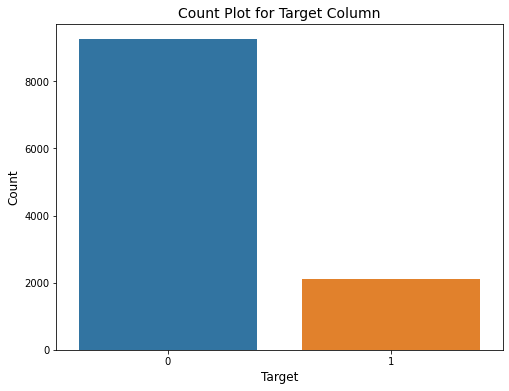

In [41]:
# Count plot for the target

ax = plt.figure(figsize = (8, 6))
ax = sns.countplot(df['target'])
ax.set_title('Count Plot for Target Column', fontsize = 14)
ax.set_xlabel('Target', fontsize = 12)
ax.set_ylabel('Count', fontsize = 12)
plt.show();

#### Most Common Words Plot

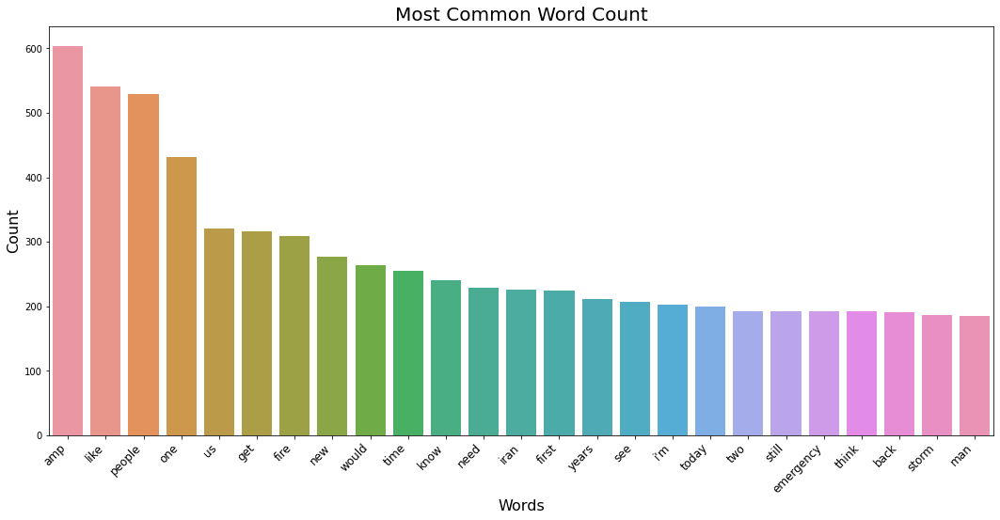

In [42]:
# Create barplot of most common words

barplot(most_common_words_df, 'word', 'count', 'Most Common Word Count', 'Words', 'Count')

#### Bigram Plot

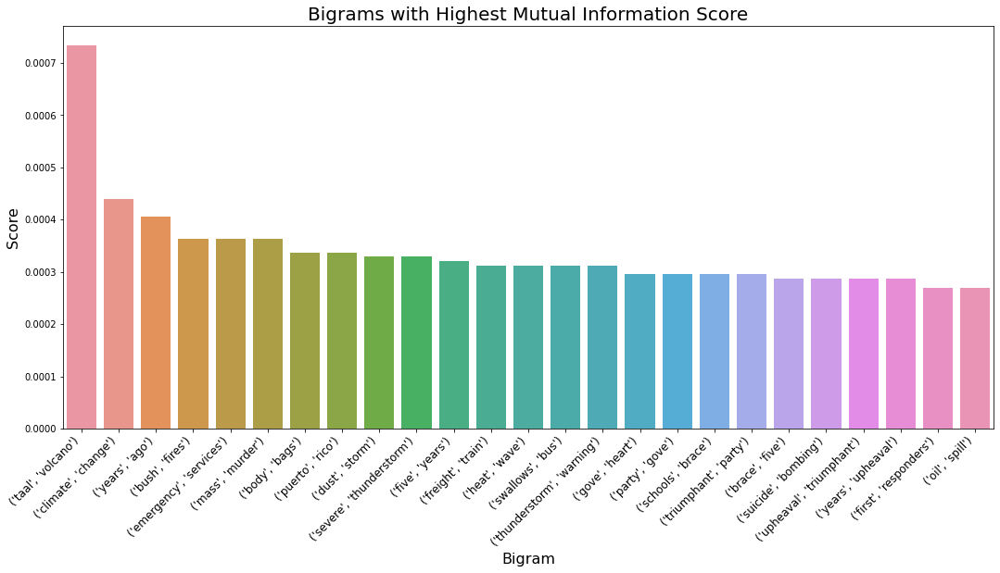

In [43]:
# Barplot of top 25 bigrams 

barplot(bigram_df, 'bigram', 'freq', 'Bigrams with Highest Mutual Information Score',
        'Bigram', 'Score')

## Model

 <div class="alert alert-info" role="alert">
Modeling was broken up into two phases: Classifiers & Neural Networks.
    </div>

### Classifier Models

#### Logistic Regression

                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.90      0.92      1872
           1       0.61      0.76      0.68       402

    accuracy                           0.87      2274
   macro avg       0.78      0.83      0.80      2274
weighted avg       0.89      0.87      0.88      2274



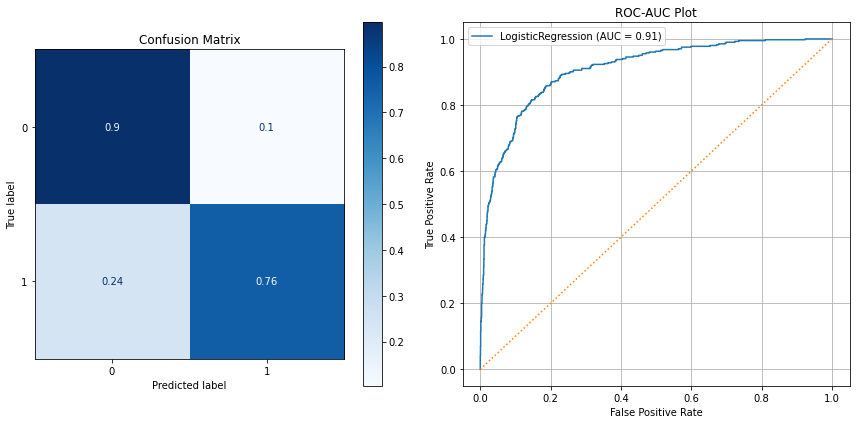

In [44]:
from sklearn.linear_model import LogisticRegression

# Putting together a base Logistic Regression

logreg = LogisticRegression(class_weight = 'balanced')
logreg.fit(X_train_processed, y_train)

# Evaluate model
evaluate_classifier(logreg, X_test_processed, y_test)

In [45]:
from sklearn.model_selection import GridSearchCV

# Let's run a gridsearch to get the best hyperparameters
params = {'class_weight': ['balanced'],
          'solver': ['lbfgs', 'liblinear'],
          'C': [1.0, 3.0, 5.0]}
grid = GridSearchCV(estimator = LogisticRegression(), 
                    param_grid = params, 
                    cv = 3, 
                    n_jobs = -1)
grid.fit(X_train_processed, y_train)

# Score with recall

GridSearchCV(cv=3, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [1.0, 3.0, 5.0], 'class_weight': ['balanced'],
                         'solver': ['lbfgs', 'liblinear']})

In [46]:
# Taking a look at the best paramaters.

print(grid.best_estimator_.get_params())

{'C': 5.0, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': None, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.91      0.92      1872
           1       0.63      0.72      0.67       402

    accuracy                           0.88      2274
   macro avg       0.78      0.82      0.80      2274
weighted avg       0.88      0.88      0.88      2274



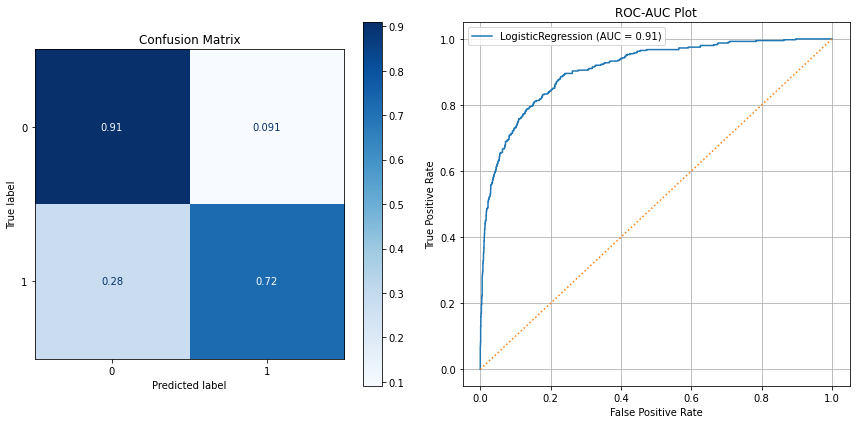

In [47]:
# Fit the best model
best_logreg_params = grid.best_params_
best_logreg_model = LogisticRegression(**best_logreg_params)
best_logreg_model.fit(X_train_processed, y_train)

# Evaluate model
evaluate_classifier(best_logreg_model, X_test_processed, y_test)

 <div class="alert alert-info" role="alert">
The Logistic Regression did surprisingly well!  In fact, the baseline logistic regression performed better before a gridsearch.
    </div>

#### SGD Classifier

                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.90      0.92      1872
           1       0.62      0.73      0.67       402

    accuracy                           0.87      2274
   macro avg       0.78      0.82      0.80      2274
weighted avg       0.88      0.87      0.88      2274



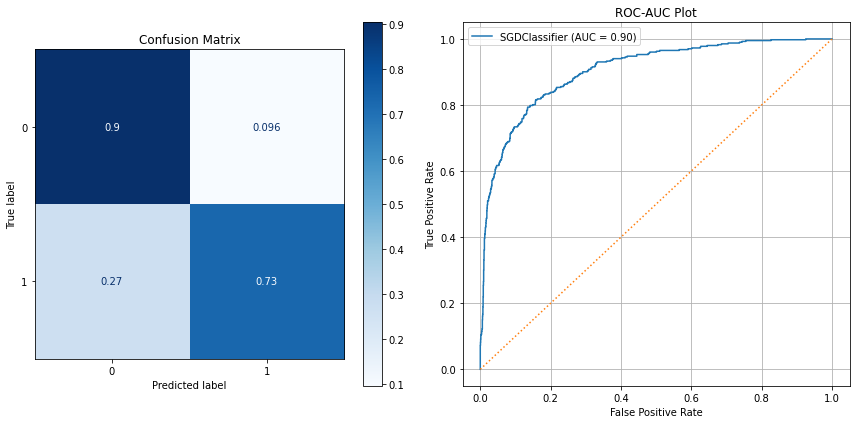

In [48]:
from sklearn.linear_model import SGDClassifier

# Fit a baseline SGDClassifier
bayes = SGDClassifier(class_weight = 'balanced', random_state = 30)
bayes.fit(X_train_processed, y_train)

# Evaluate Model
evaluate_classifier(bayes, X_test_processed, y_test)

In [49]:
# Let's do a gridsearch with this thing

params = {'class_weight': ['balanced'],
          'random_state': [30],
          'loss': ['hinge', 'perceptron'],
          'penalty': ['l1', 'l2']}
grid = GridSearchCV(estimator = SGDClassifier(), 
                    param_grid = params, 
                    cv = 3, 
                    n_jobs = -1)
grid.fit(X_train_processed, y_train)

GridSearchCV(cv=3, estimator=SGDClassifier(), n_jobs=-1,
             param_grid={'class_weight': ['balanced'],
                         'loss': ['hinge', 'perceptron'],
                         'penalty': ['l1', 'l2'], 'random_state': [30]})

In [50]:
# Check out the best parameters
print(grid.best_estimator_.get_params())

{'alpha': 0.0001, 'average': False, 'class_weight': 'balanced', 'early_stopping': False, 'epsilon': 0.1, 'eta0': 0.0, 'fit_intercept': True, 'l1_ratio': 0.15, 'learning_rate': 'optimal', 'loss': 'hinge', 'max_iter': 1000, 'n_iter_no_change': 5, 'n_jobs': None, 'penalty': 'l2', 'power_t': 0.5, 'random_state': 30, 'shuffle': True, 'tol': 0.001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.90      0.92      1872
           1       0.62      0.73      0.67       402

    accuracy                           0.87      2274
   macro avg       0.78      0.82      0.80      2274
weighted avg       0.88      0.87      0.88      2274



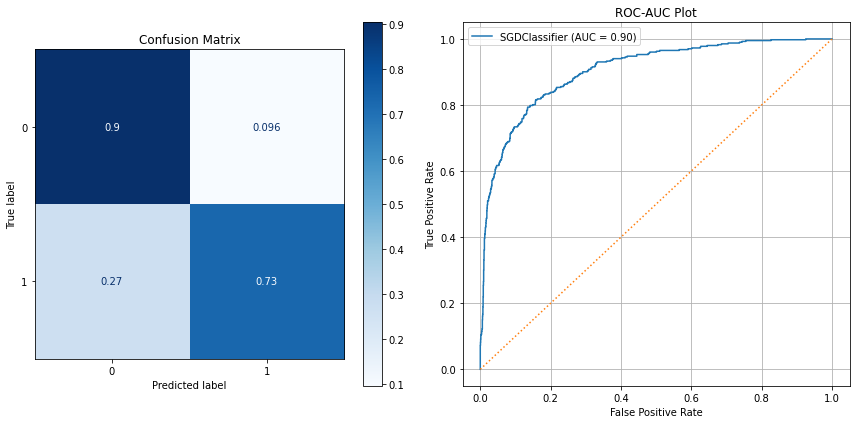

In [51]:
# Fit the best model

best_sgd_params = grid.best_params_
best_sgd_model = SGDClassifier(**best_sgd_params)
best_sgd_model.fit(X_train_processed, y_train)

# Evaluate model
evaluate_classifier(best_sgd_model, X_test_processed, y_test)

 <div class="alert alert-info" role="alert">
The SGD also did rather well.  The Logistic Regression slightly edges it out in terms of recall. 
    </div>

#### Random Forest

                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.98      0.93      1872
           1       0.85      0.42      0.56       402

    accuracy                           0.88      2274
   macro avg       0.87      0.70      0.75      2274
weighted avg       0.88      0.88      0.87      2274



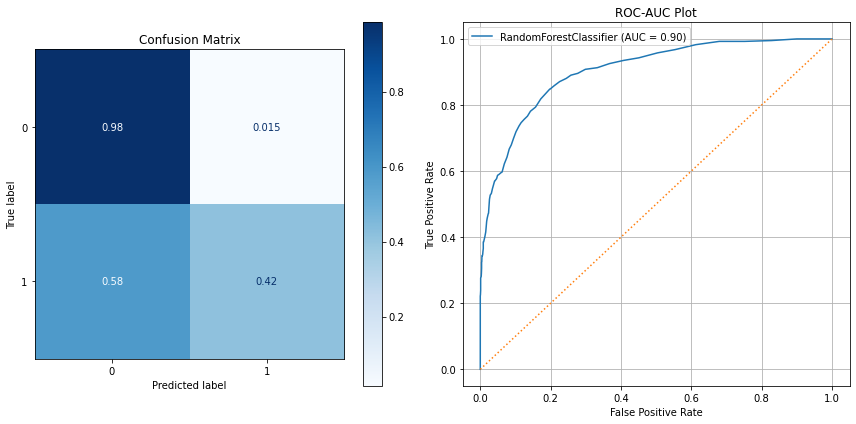

In [52]:
# Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier

forest = RandomForestClassifier(class_weight = 'balanced', random_state = 30)
forest.fit(X_train_processed, y_train)

# Get Predictions & Evaluate
evaluate_classifier(forest, X_test_processed, y_test)

In [53]:
# Gridsearch for Random Forest
params = {'class_weight': [None, 'balanced'],
          'random_state': [30],
          'criterion': ['gini', 'entropy'], 
          'max_depth': [3, 5, 10], 
          'min_samples_leaf': [1, 5, 10]}
grid = GridSearchCV(estimator = RandomForestClassifier(),
                    param_grid = params, 
                    cv = 3, 
                    n_jobs = -1)
grid.fit(X_train_processed, y_train)

GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'class_weight': [None, 'balanced'],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 10],
                         'min_samples_leaf': [1, 5, 10], 'random_state': [30]})

In [54]:
# Checking the best hyperparameters

print(grid.best_estimator_.get_params())

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 10, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 30, 'verbose': 0, 'warm_start': False}


                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.90      0.93      0.92      1872
           1       0.63      0.53      0.57       402

    accuracy                           0.86      2274
   macro avg       0.76      0.73      0.75      2274
weighted avg       0.85      0.86      0.86      2274



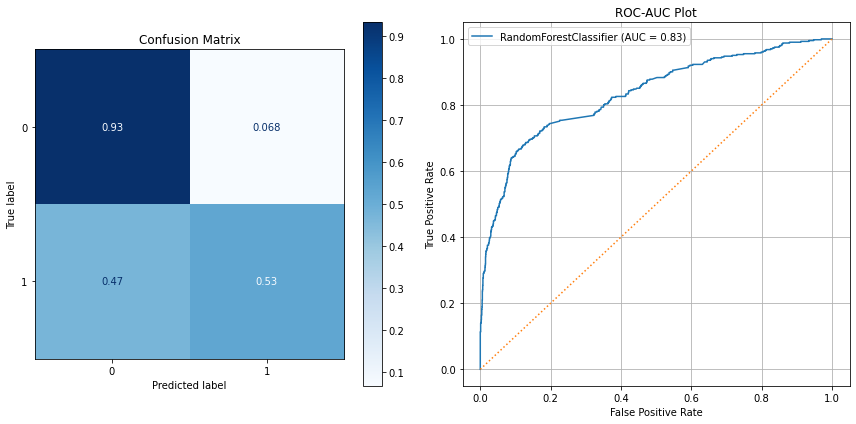

In [55]:
# Fit a new model with the best paramaters from GridSearchCV

best_rf_params = grid.best_params_
best_rf_model = RandomForestClassifier(**best_rf_params)
best_rf_model.fit(X_train_processed, y_train)

# Evaluate the model
evaluate_classifier(best_rf_model, X_test_processed, y_test)

 <div class="alert alert-info" role="alert">
Random Forest was fairly accurate but didn't do well in terms of recall. 
    </div>

#### XGBoost - Commented Out For Now

In [56]:
from xgboost import XGBClassifier

# # Build and fit a basic XGBoost
# xgb = XGBClassifier()
# xgb.fit(X_train_processed, y_train)

# # Evaluate the model
# evaluate_classifier(xgb, X_test_processed, y_test)

In [57]:
X_train[0]

'Communal violence in Bhainsa, Telangana. "Stones were pelted on Muslims\' houses and some houses and vehicles were set ablaze…'

In [58]:
# Let's do a gridsearch for this 

# params = {'gamma': [0.5, 1, 5],
#           'booster': ['gbtree', 'gblinear'],
#           'min_child_weight': [1, 5, 10],
#           'max_depth': [3, 5],
#           'scale_pos_weight': [1, 1000]}
# grid = GridSearchCV(estimator = XGBClassifier(), 
#                     param_grid = params, 
#                     cv = 3, 
#                     n_jobs = -1)
# grid.fit(X_train_processed, y_train)

In [59]:
# # Get best parameters

# print(grid.best_estimator_.get_params())

In [60]:
# # Fit a new model with the best parameters

# best_xgb_params = grid.best_params_
# best_xgb_model = XGBClassifier(**best_xgb_params, random_state = 30)
# best_xgb_model.fit(X_train_processed, y_train)

In [61]:
# # Evaluate model

# evaluate_classifier(best_xgb_model, X_test_processed, y_test)

#### Stacking Classifier

                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      1872
           1       0.69      0.68      0.68       402

    accuracy                           0.89      2274
   macro avg       0.81      0.81      0.81      2274
weighted avg       0.89      0.89      0.89      2274



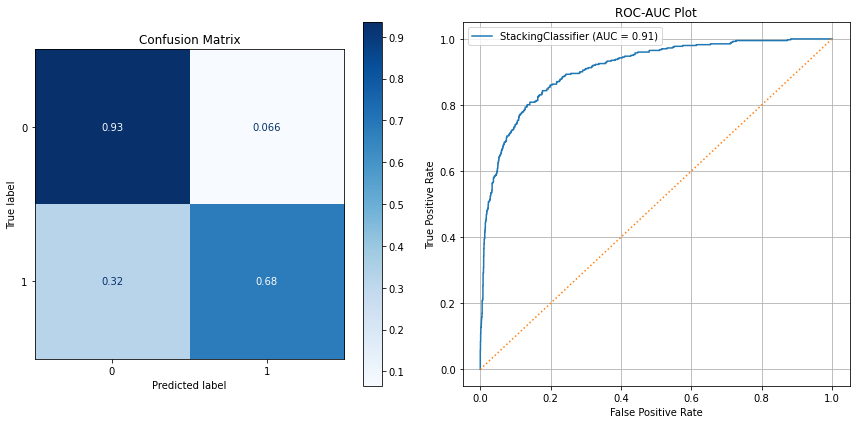

In [62]:
from sklearn.ensemble import StackingClassifier

# Fit the stacking classifier
estimators = [('logreg', logreg),
              ('sgd', best_sgd_model)]
             # ('rf', best_rf_model)]
#               ('xg', best_xgb_model)]

stack = StackingClassifier(estimators = estimators, cv = 3, n_jobs = -1)
stack.fit(X_train_processed, y_train)

# Evaluate the model
evaluate_classifier(stack, X_test_processed, y_test)

# look up voting clasifier 

 <div class="alert alert-info" role="alert">
Surprisngly, the stack of the Logistic Regression and SGD didn't do as well as the simple Logistic Regression model.
    </div>

#### Conclusion

 <div class="alert alert-info" role="alert">
Going to have to go over the results of this but it seems like the best models were Logistic Regression and SGD Classifier.  We can pull the most important features from this and interpret these results a little more closely.
    </div>

In [63]:
print('Recall Scores for Each Model')
print('------------------------------')
print('Logistic Regression: ', round(get_recall(logreg, X_test_processed, y_test), 2))
print('SGD: ', round(get_recall(best_sgd_model, X_test_processed, y_test), 2))
print('Random Forest: ', round(get_recall(best_rf_model, X_test_processed, y_test), 2))
print('Stacking Classifier: ', round(get_recall(stack, X_test_processed, y_test), 2))

Recall Scores for Each Model
------------------------------
Logistic Regression:  0.76
SGD:  0.73
Random Forest:  0.53
Stacking Classifier:  0.68


### Neural Networks - First Attempt

 <div class="alert alert-info" role="alert">
The neural networks in this section represent the results of a HIGHLY iterative process where we attempted literally hundreds of combinations of layers, parameters, preprocessing methods, optimizers, activation functions, and basically any tunable paramter you can think of.  Results varied greatly and we also encountered an odd phenomenon where the model would seem to be highly accurate but would not produce accurate predictions.  The following represents a compromise between getting decent predictions and allowing a bit of overfitting.  This is something that will be rectified in later versions of this notebook. 
    </div>

#### Preprocessing for RNN

In [64]:
# Making sure X & y still exist

print(X)
print(y)

0        Communal violence in Bhainsa, Telangana. "Ston...
1        Telangana: Section 144 has been imposed in Bha...
2        Arsonist sets cars ablaze at dealership https:...
3        Arsonist sets cars ablaze at dealership https:...
4        "Lord Jesus, your love brings freedom and pard...
                               ...                        
11365    Media should have warned us well in advance. T...
11366    i feel directly attacked 💀 i consider moonbin ...
11367    i feel directly attacked 💀 i consider moonbin ...
11368    ok who remember "outcast" nd the "dora" au?? T...
11369       Jake Corway wrecked while running 14th at IRP.
Name: text, Length: 11370, dtype: object
0        1
1        1
2        1
3        1
4        0
        ..
11365    0
11366    0
11367    0
11368    0
11369    1
Name: target, Length: 11370, dtype: int64


##### Testing for a cleaning function

In [65]:
# Creating new X & Y

text_data = df['text'].copy()
y = df['target'].values

y.shape

(11370,)

In [66]:
# Remove Stop words 
text_data = [word for word in text_data if word not in stop_words_list]

# Create & fit a tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(text_data)

# Create a text sequence
X = tokenizer.texts_to_sequences(text_data)
X = sequence.pad_sequences(X)

# Save the length of X
sequence_length = X.shape[1]

# Save words
word_index = tokenizer.index_word
reverse_index = {v:k for k, v in word_index.items()}

In [67]:
# Create new train_test_split
X_train_nn, X_test_nn, y_train_nn, y_test_nn = train_test_split(X, y, test_size = 0.2, 
                                                                random_state = 30, stratify = y)

print('X_train shape is', X_train_nn.shape)
print('X_test shape is', X_test_nn.shape)
print('y_train shape is', y_train_nn.shape)
print('y_test shape is', y_test_nn.shape)


X_train shape is (9096, 33)
X_test shape is (2274, 33)
y_train shape is (9096,)
y_test shape is (2274,)


In [68]:
# Checking Class Weights

y_train_df = pd.DataFrame(y_train_nn)
y_train_df[0].value_counts(1)

0    0.814094
1    0.185906
Name: 0, dtype: float64

In [69]:
# SMOTE

undersample = SMOTE(sampling_strategy = 0.1)
X_train_resampled_nn, y_train_resampled_nn = SMOTE().fit_resample(X_train_nn, y_train_nn) 

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [95]:
weight_labels = df['target'].copy()

In [98]:
# Dealing with class imbalance
from sklearn.utils.class_weight import compute_class_weight

weights = compute_class_weight('balanced', np.unique(weight_labels), weight_labels)
weights = dict(zip(np.unique(weight_labels), weights))
weights

{0: 0.6141961970613656, 1: 2.6892147587511825}

##### GloVe - Revisit - File deleted - Commented Out

In [71]:
# GloVe embeddings kept killing the kernel.  Revisit this as well.

# import os

# glove = {}
# f = open(os.path.join('glove.twitter.27B.25d.txt'))
# for line in f:
#     values = line.split()
#     word = values[0]
#     coefs = np.asarray(values[1:], dtype='float32')
#     glove[word] = coefs
# f.close()

# embedding_dim = len(glove)

# print('Found %s word vectors.' % len(glove))

In [72]:
# glove_matrix = np.zeros((len(word_index) + 1, embedding_dim))
# for word, i in word_index.items():
#     embedding_vector = glove.get(word)
#     if embedding_vector is not None:
#         # words not found in embedding index will be all-zeros.
#         glove_matrix[i] = embedding_vector

#### LSTM Model

 <div class="alert alert-info" role="alert">
Below is an LSTM sequence model and this represents the final result (best model) of many, many iterations of various combinations of architectures and hyperparameters.  
    </div>

Epoch 1/25
100/100 [==============================] - 47s 467ms/step - loss: 6.1335 - acc: 0.5144 - val_loss: 0.7413 - val_acc: 0.5218
Epoch 2/25
100/100 [==============================] - 48s 479ms/step - loss: 0.5699 - acc: 0.7528 - val_loss: 0.4696 - val_acc: 0.8212
Epoch 3/25
100/100 [==============================] - 44s 442ms/step - loss: 0.4586 - acc: 0.8434 - val_loss: 0.4870 - val_acc: 0.8219
Epoch 4/25
100/100 [==============================] - 42s 424ms/step - loss: 0.3964 - acc: 0.8751 - val_loss: 0.4105 - val_acc: 0.8461
Epoch 5/25
100/100 [==============================] - 43s 433ms/step - loss: 0.3770 - acc: 0.8874 - val_loss: 0.4423 - val_acc: 0.8289
                 Model Evaluation
-------------------------------------------------------
72/72 [==============================] - 4s 56ms/step - loss: 0.4699 - acc: 0.8215
[0.46990859508514404, 0.8214600086212158]
 
                 Loss & Accuracy Curves
-------------------------------------------------------


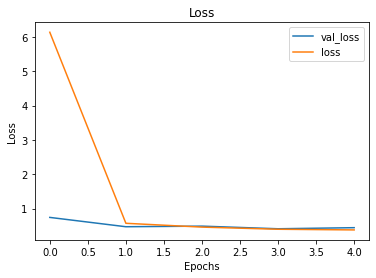

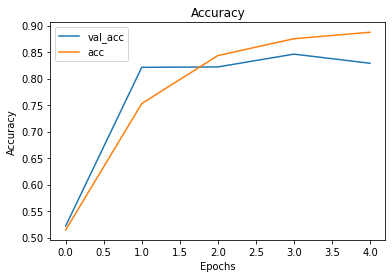

 
                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.91      0.86      0.89      1851
           1       0.52      0.65      0.58       423

    accuracy                           0.82      2274
   macro avg       0.72      0.76      0.73      2274
weighted avg       0.84      0.82      0.83      2274

 
                 Confusion Matrix
-------------------------------------------------------


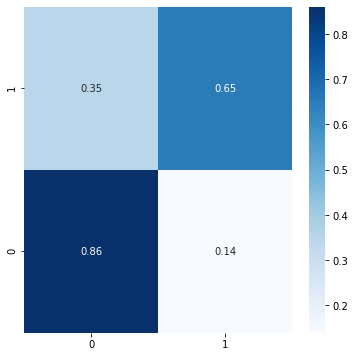

In [129]:
# Early Stopping 
callback = EarlyStopping(monitor = 'val_acc', patience = 3, mode = 'max', 
                         min_delta = .1, restore_best_weights = True)

# Create a base neural network
model = Sequential()

# Embedding layer
model.add(Embedding(input_dim = len(tokenizer.word_index) + 1, 
                           input_length = sequence_length, 
                           output_dim = 100)) 

# Broke computer - Try again Later
# model.add(Embedding(input_dim = len(tokenizer.word_index) + 1, 
#                     weights = [glove_matrix],
#                     input_length = sequence_length, 
#                     output_dim = embedding_dim, trainable = False))

model.add(SpatialDropout1D(0.3))

# Hidden Layers
model.add(Bidirectional(LSTM(activation = 'tanh', units = 256, dropout = 0.3, 
                             recurrent_dropout = 0.3, kernel_regularizer = regularizers.l2(.1))))

# model.add(LSTM(activation = 'relu', units = 256, dropout = 0.3, 
#                              recurrent_dropout = 0.3, kernel_regularizer = regularizers.l2(.1)))
# model.add(Dropout(0.3))

model.add(Dense(128, activation = 'relu'))
model.add(Dropout(0.3))

model.add(Dense(64, activation = 'tanh'))
model.add(Dropout(0.3))

model.add(Dense(32, activation = 'tanh'))
model.add(Dropout(0.3)) 

# model.add(LeakyReLU(alpha = 0.1))
# model.add(Dropout(0.3))

# Output layer
model.add(Dense(1, activation = 'sigmoid'))

# Compile
model.compile(optimizer = 'RMSProp', loss = 'binary_crossentropy', metrics = ['acc'])

# Fit model
history = model.fit(X_train_nn, y_train_nn, batch_size = 64, epochs = 25, 
                    validation_split = 0.3, callbacks = callback, class_weight = weights) 

# Evaluating the model 
evaluate_network(history, model, X_test_nn, y_test_nn)


In [130]:
# Get predictions

model1_preds = model.predict(X_test_nn).round()
model1_preds_df = pd.DataFrame(model1_preds)
model1_preds_df[0].value_counts()

0.0    1741
1.0     533
Name: 0, dtype: int64

In [131]:
# Compare with the actual target values

model_true_df = pd.DataFrame(y_test)
model_true_df['target'].value_counts()

0    1872
1     402
Name: target, dtype: int64

##### Conclusion

 <div class="alert alert-info" role="alert">
 After going through literally hundreds of different combinations of parameters, this was the best result that we were able to get to.  Not fantastic, but still better than random guessing.
    </div>

### Neural Networks - Second Attempt

 <div class="alert alert-info" role="alert">
After what seemed like an eternity of reworking the previous neural networks with no improvement in either accuracy or the predictions issue, we decided to start fresh with a different method of preprocessing to see if maybe the issue was pre-modeling.  The neural network below was less iterative than the previous models as it was more of an experiment in preprocessing.
    </div>

#### Preprocessing

In [135]:
# Making sure we still have a clean dataframe.

df.head()

,keyword,text,target
0,ablaze,"Communal violence in Bhainsa, Telangana. ""Ston...",1
1,ablaze,Telangana: Section 144 has been imposed in Bha...,1
2,ablaze,Arsonist sets cars ablaze at dealership https:...,1
3,ablaze,Arsonist sets cars ablaze at dealership https:...,1
4,ablaze,"""Lord Jesus, your love brings freedom and pard...",0


In [144]:
# Create a new X & y and do "manual preprocessing"

X = df['text'].copy()
y_new = df['target'].copy()

X_new = X.map(lambda x: remove_url(x))
X_new = X_new.map(lambda x: remove_html(x))
XX_new= X_new.map(lambda x: remove_emoji(x))
X_new = X_new.map(lambda x: remove_punctuation(x))

X_new

0        Communal violence in Bhainsa Telangana Stones ...
1        Telangana Section 144 has been imposed in Bhai...
2                 Arsonist sets cars ablaze at dealership 
3                Arsonist sets cars ablaze at dealership  
4        Lord Jesus your love brings freedom and pardon...
                               ...                        
11365    Media should have warned us well in advance Th...
11366    i feel directly attacked 💀 i consider moonbin ...
11367    i feel directly attacked 💀 i consider moonbin ...
11368    ok who remember outcast nd the dora au THOSE A...
11369        Jake Corway wrecked while running 14th at IRP
Name: text, Length: 11370, dtype: object

In [145]:
# Remove stopwords 

X_new = X_new.map(remove_stopwords)
X_new

0        communal violence bhainsa telangana stones pel...
1        telangana section 144 imposed bhainsa january ...
2                     arsonist sets cars ablaze dealership
3                     arsonist sets cars ablaze dealership
4        lord jesus love brings freedom pardon fill hol...
                               ...                        
11365    media warned us well advance wrecked whole nig...
11366    feel directly attacked 💀 consider moonbin amp ...
11367    feel directly attacked 💀 consider moonbin amp ...
11368    ok remember outcast nd dora au au wrecked nerv...
11369                 jake corway wrecked running 14th irp
Name: text, Length: 11370, dtype: object

In [146]:
# Create a counter as an alternative to FreqDist

from collections import Counter

def counter_word(text):
    '''Creates a counter for each word in text data'''
    count = Counter()
    for i in text.values:
        for word in i.split():
            count[word] += 1
    
    return count

In [147]:
# Implement the counter function

counter = counter_word(X_new)
print('Total Number of Words:', len(counter))
counter

Total Number of Words: 25889


Counter({'communal': 4,
         'violence': 30,
         'bhainsa': 14,
         'telangana': 13,
         'stones': 8,
         'pelted': 4,
         'muslims': 20,
         'houses': 32,
         'vehicles': 17,
         'set': 76,
         'ablaze…': 2,
         'section': 9,
         '144': 1,
         'imposed': 2,
         'january': 73,
         '13': 39,
         '15': 50,
         'clash': 8,
         'erupted': 9,
         'two': 177,
         'groups': 12,
         '12': 31,
         'po…': 9,
         'arsonist': 13,
         'sets': 8,
         'cars': 17,
         'ablaze': 22,
         'dealership': 2,
         'lord': 18,
         'jesus': 28,
         'love': 135,
         'brings': 11,
         'freedom': 16,
         'pardon': 1,
         'fill': 3,
         'holy': 14,
         'spirit': 4,
         'heart': 91,
         'l…': 30,
         'child': 33,
         'chinese': 28,
         'tweet': 41,
         'would': 252,
         'gone': 30,
         'viral': 8,
   

In [148]:
# Set num_words and max_length

num_words = len(counter)

max_length = 80 # Totally arbitrary number

In [149]:
# Train/Test Split
# video reference: train_sentences, train_labels, test_sentences, test labels

X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_new, y_new, test_size = 0.2, random_state = 30)

In [150]:
# Create tokenizer

tokenizer = Tokenizer(num_words = num_words)
tokenizer.fit_on_texts(X_train_2)

In [151]:
# Create sequences 

train_sequences = tokenizer.texts_to_sequences(X_train_2)
train_sequences[0]

[4, 5722, 104, 10, 57, 775, 1215]

In [152]:
# Create a word index

word_index = tokenizer.word_index
word_index

{'amp': 1,
 'like': 2,
 'people': 3,
 'one': 4,
 'us': 5,
 'get': 6,
 'new': 7,
 'fire': 8,
 'im': 9,
 'would': 10,
 'time': 11,
 'know': 12,
 'need': 13,
 'first': 14,
 'see': 15,
 'years': 16,
 '2': 17,
 'still': 18,
 'iran': 19,
 'dont': 20,
 't…': 21,
 'think': 22,
 'today': 23,
 'emergency': 24,
 'two': 25,
 'it’s': 26,
 'back': 27,
 'storm': 28,
 '1': 29,
 'i’m': 30,
 'many': 31,
 'want': 32,
 'news': 33,
 'day': 34,
 'fires': 35,
 'man': 36,
 'body': 37,
 'australia': 38,
 'please': 39,
 'got': 40,
 'go': 41,
 'also': 42,
 'trump': 43,
 'really': 44,
 'nuclear': 45,
 '…': 46,
 'killed': 47,
 'said': 48,
 'could': 49,
 'last': 50,
 'help': 51,
 'attack': 52,
 'say': 53,
 'right': 54,
 'never': 55,
 'much': 56,
 'love': 57,
 'good': 58,
 'going': 59,
 'police': 60,
 'world': 61,
 'a…': 62,
 'volcano': 63,
 'even': 64,
 'taal': 65,
 'death': 66,
 'another': 67,
 'year': 68,
 '2020': 69,
 'don’t': 70,
 'due': 71,
 'take': 72,
 'bomb': 73,
 'come': 74,
 'every': 75,
 '3': 76,
 'make'

In [153]:
# Making sure this worked

X_train_2[0]

'communal violence bhainsa telangana stones pelted muslims houses houses vehicles set ablaze…'

In [154]:
# Create padded sequences for training set

from keras.preprocessing.sequence import pad_sequences

train_padded = pad_sequences(train_sequences, maxlen = max_length, padding = 'post', truncating = 'post')
train_padded[0]

array([   4, 5722,  104,   10,   57,  775, 1215,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0], dtype=int32)

In [155]:
# Create wod and padding sequence for test set

test_sequences = tokenizer.texts_to_sequences(X_test_2)
test_padded = pad_sequences(test_sequences, maxlen = max_length, padding = 'post', truncating = 'post')

In [156]:
# Create a way to get it back to words

reverse_word_index = dict([(value, key) for (key, value) in word_index.items()])

def decode_sequence(text):
    '''Returns a sequence back to human words'''
    return " ".join([reverse_word_index.get(i, '?') for i in text])

decode_sequence(train_sequences[1])

'pubg provide unmitigated blizzard goop'

In [157]:
# Testing 

train_sequences[1]

[9133, 1143, 9134, 740, 9135]

In [158]:
# Testing

word_index['pubg']

9133

In [159]:
# Get some shapes

print('Train Shape:', train_padded.shape)
print('Test Shape:', test_padded.shape)

Train Shape: (9096, 80)
Test Shape: (2274, 80)


#### Modeling

Epoch 1/25
100/100 [==============================] - 105s 1s/step - loss: 6.1463 - acc: 0.4544 - val_loss: 0.7183 - val_acc: 0.1847
Epoch 2/25
100/100 [==============================] - 105s 1s/step - loss: 0.7127 - acc: 0.4399 - val_loss: 0.7480 - val_acc: 0.3096
Epoch 3/25
100/100 [==============================] - 111s 1s/step - loss: 0.5344 - acc: 0.7869 - val_loss: 0.4956 - val_acc: 0.8091
Epoch 4/25
100/100 [==============================] - 106s 1s/step - loss: 0.4115 - acc: 0.8693 - val_loss: 0.4013 - val_acc: 0.8553
Epoch 5/25
100/100 [==============================] - 105s 1s/step - loss: 0.6603 - acc: 0.6706 - val_loss: 0.6973 - val_acc: 0.8153
Epoch 6/25
100/100 [==============================] - 105s 1s/step - loss: 0.7154 - acc: 0.4962 - val_loss: 0.6791 - val_acc: 0.8153
                 Model Evaluation
-------------------------------------------------------
72/72 [==============================] - 9s 118ms/step - loss: 0.4284 - acc: 0.8562
[0.4284469187259674, 0.85620

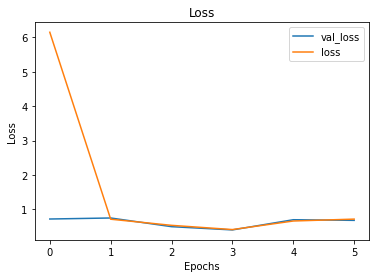

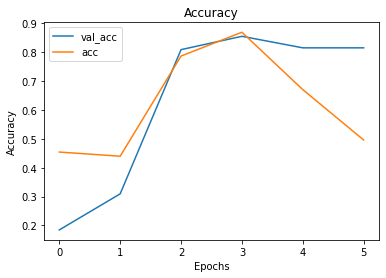

 
                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.90      0.91      1872
           1       0.58      0.66      0.62       402

    accuracy                           0.86      2274
   macro avg       0.75      0.78      0.76      2274
weighted avg       0.86      0.86      0.86      2274

 
                 Confusion Matrix
-------------------------------------------------------


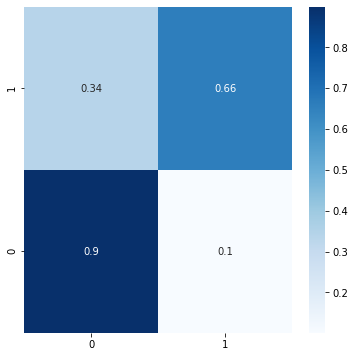

In [172]:
# Early Stopping 
callback = EarlyStopping(monitor = 'val_acc', patience = 3, mode = 'max', 
                         min_delta = .1, restore_best_weights = True)

# Create a base neural network
model4 = Sequential()

# Embedding layer
model4.add(Embedding(input_dim = len(word_index) + 1, 
                           input_length = max_length, 
                           output_dim = 100))
model4.add(SpatialDropout1D(0.3))

# Hidden Layers
model4.add(Bidirectional(LSTM(activation = 'tanh', units = 256, dropout = 0.3, 
                             recurrent_dropout = 0.3, kernel_regularizer = regularizers.l2(.1))))
# model4.add(Dropout(0.3))

model4.add(Dense(128, activation = 'tanh'))
model4.add(Dropout(0.3))

model4.add(Dense(64, activation = 'tanh'))
model4.add(Dropout(0.3))

model4.add(Dense(32, activation = 'tanh'))
model4.add(Dropout(0.3))

model4.add(LeakyReLU(alpha = 0.1))
# model4.add(Dropout(0.3))

# Output layer
model4.add(Dense(1, activation = 'sigmoid'))

# Compile
model4.compile(optimizer = 'RMSProp', loss = 'binary_crossentropy', metrics = ['acc'])

# Fit 
history4 = model4.fit(train_padded, y_train_2, batch_size = 64,
                      epochs = 25,validation_split = 0.3, callbacks = callback, 
                      class_weight = weights)

# Evaluate
evaluate_network(history4, model4, test_padded, y_test_2)

In [173]:
# Get Predictions
model4_preds = model4.predict_on_batch(test_padded).round()
model4_preds_df = pd.DataFrame(model4_preds)
print(model4_preds_df[0].value_counts())

0.0    1819
1.0     455
Name: 0, dtype: int64


 <div class="alert alert-info" role="alert">
This performed slightly better than the first time around.  Definitely still needs work.  
    </div>

## Interpret

### Interpretations from Classifiers

#### Feature Importances

In [174]:
logreg.coef_

array([[ 0.12794949, -0.04185109, -0.04306415, ..., -0.10231402,
        -0.05854621, -0.05197849]])

In [175]:
vectorizer.get_feature_names()

['#039',
 '#100asianheartthrobs2020',
 '#1037thebeat',
 '#10552-c',
 '#10tv',
 '#127liveslost',
 '#1495days',
 '#1496days',
 '#152',
 '#19yearsofdheena',
 '#20plenty',
 '#20yearsofhrithikroshan',
 '#365daysofbiking',
 '#3f6a2d',
 '#49ers',
 '#4daystotitanscollections',
 '#5daystotitanscollections',
 '#5g',
 '#7news',
 '#911lonestar',
 '#962',
 '#a1',
 '#a12',
 '#a141',
 '#a303',
 '#a5339426',
 '#a92',
 '#abc730',
 '#ablanari',
 '#abor',
 '#aborbitadi',
 '#aboriginal',
 '#acce',
 '#account',
 '#actionad',
 '#actors',
 '#adoreyou',
 '#ados',
 '#advocate',
 '#afghanistan',
 '#africakwetu',
 '#afroseries',
 '#aftershock',
 '#aftodioikisi',
 '#afzalguru',
 '#agbarr',
 '#agchat',
 '#agnation',
 '#ahorasuena',
 '#airline',
 '#airquality',
 '#ajaydevgan',
 '#ajk',
 '#alabtopspotonmyx',
 '#alaska',
 '#alavaikunthapurramloo',
 '#aldubxadnbayanihantayo',
 '#alert',
 '#alertwr',
 '#alfdubs',
 '#algw',
 '#allah_is_kabir',
 '#allatsea',
 '#allsaintspassage',
 '#alshabaab',
 '#alshamrani-now',
 '#alt

In [176]:
# Get the feature importances from the Logistic Regression model

# features_dict = {'Features': vectorizer.get_feature_names(),
#                  'Importance': logreg.coef_}

# feature_importances = pd.DataFrame(features_dict, columns = ['Features', 'Importance'])

# print(features_importances.shape)
# feature_importances

#### SHAP

In [177]:
# Creating shap values and a shap explainer
import shap

X_shap = shap.sample(X_test_processed, 250)
explainer = shap.LinearExplainer(logreg, X_shap, feature_dependence="independent")
shap_values = explainer.shap_values(X_shap)

The option feature_dependence has been renamed to feature_perturbation!
The option feature_perturbation="independent" is has been renamed to feature_perturbation="interventional"!


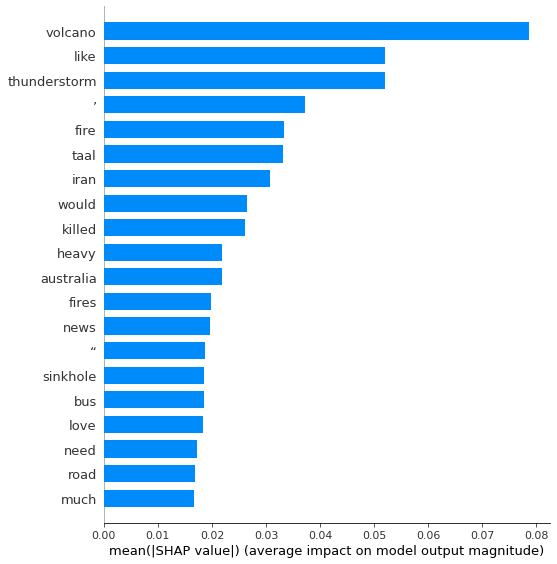

In [178]:
# Plotting a shap summary barplot

shap.summary_plot(shap_values, X_shap, plot_type = 'bar', feature_names = vectorizer.get_feature_names())

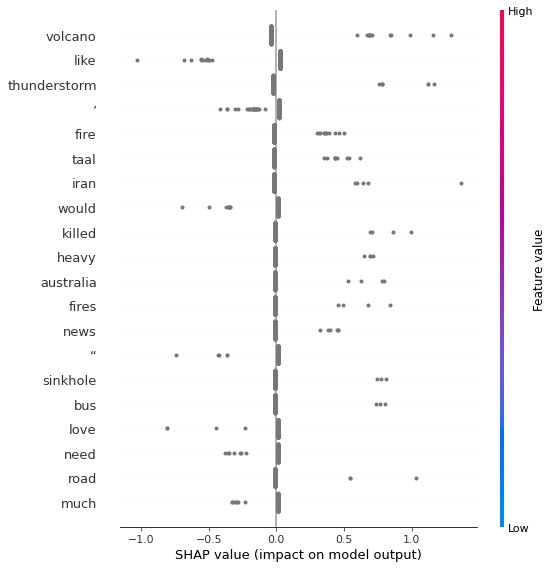

In [179]:
# Plotting a shap summary importance plot

shap.summary_plot(shap_values, X_test_processed, feature_names = vectorizer.get_feature_names())

### Interpretations from Neural Networks

 <div class="alert alert-info" role="alert">
Interpeting neural networks with Lime proved to be extremely difficult.  I was able to get a solid walkthrough of how to do this from  <a href="https://www.youtube.com/watch?v=lTgB8lf5Zcothis">from this youtube video.</a>
</div>

In [180]:
# Using Lime to attempt to explain the output of our neural networks

import lime
from lime.lime_text import LimeTextExplainer

explainer = LimeTextExplainer(class_names = ['non-disaster', 'disaster'])

In [181]:
# In order to do this, we must create a new function to make predictions that Lime will play ball with

def new_predict(texts):
    '''Gets new predictions that are compatible with Lime'''
    _seq = tokenizer.texts_to_sequences(texts)
    _text_data = pad_sequences(_seq, maxlen = max_length, padding = 'post', truncating = 'post')
    
    return np.array([[float(1 - x), float(x)] for x in model4.predict(_text_data)])

In [182]:
# Testing a sentence

X_test_2.iloc[-1]

'hong kong police terrorism 2020'

In [183]:
# Testing a padded sequence

test_padded[-1]

array([1946, 2127,   60,  769,   69,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0], dtype=int32)

In [184]:
# Testing the prediction function

model4.predict(test_padded[-1].reshape(1, -1))

array([[0.36176932]], dtype=float32)

In [185]:
# Using a Lime Explainer with a random entry

exp = explainer.explain_instance(X_test_2.iloc[0], new_predict, num_features = max_length, top_labels = 0)
exp.show_in_notebook(text = False)

split() requires a non-empty pattern match.


In [186]:
# Using a Lime Explainer with a random entry

exp = explainer.explain_instance(X_test_2.iloc[1], new_predict, num_features = max_length, top_labels = 1)
exp.show_in_notebook(text = False)

split() requires a non-empty pattern match.


In [187]:
exp = explainer.explain_instance(X_test_2.iloc[24], new_predict, num_features = max_length, top_labels = 24)
exp.show_in_notebook(text = False)

split() requires a non-empty pattern match.


In [188]:
exp = explainer.explain_instance(X_test_2.iloc[8], new_predict, num_features = max_length, top_labels = 8)
exp.show_in_notebook(text = False)

split() requires a non-empty pattern match.


In [189]:
exp = explainer.explain_instance(X_test_2.iloc[98], new_predict, num_features = max_length, top_labels = 98)
exp.show_in_notebook(text = False)

split() requires a non-empty pattern match.


## Conclusion

Social media outlets are increasingly becoming a primary outlet for breaking news and the ability to be able to determine whether a post is newsworthy or nonsense is vital to creating awareness of events and if needed, increase the response time for an emergency.  Throughout this notebook, we attempted to create machine learning models that could accurately predict whether or not a tweet was in reference to a disaster.  This model could be deployed as a social media monitor that can take in a series of twweets and determine if it is a "disaster tweet" or just a run of the mill post.  For example, the difference between "The plane crashed." and "We crashed the party.  

### Results

Throughout this notebook, we experimented with using both supervised machine learning methods as well as deep learning methods in order to try to produce the most accurate model possible. 
 <div class="alert alert-info" role="alert">
<b><u>With the conclusion of this experiment, we have achieved the following results:</b></u>
 - <b>Phrases are more significant than single words:</b> When comparing bigrams to common words, the bigrams were much more telling of whether or not a sentence would be in reference to a disaster.<br><br>
 
 - <b>Complexity isn't always better:</b> In this experiment, a simple Logistic Regression model outpeformed highly complex neural networks, and did so in a fraction of the time.<br><br>
 
 - <b> "Disaster" Keywords have the highest feature importance:</b> Words appearing in the top 20 most important include volcano, thunderstorm, fire, fires, killed, sinkhole, etc.
 
 </div>

### Recommendations 

<b>Based on this analysis, we can make the following recommendations:</b>
 <div class="alert alert-info" role="alert">
- For basic NLP, focus on short phrases that include a "Disaster" Keyword
- In terms of modeling, use a Logistic Regression model.
- Create a supervised machine learning model that focuses on learning short phrases as opposed to single words.
    </div>

### Future Work

<b>With more time, we can improve on this model in the following ways:</b>
 <div class="alert alert-info" role="alert">
- <b>Scrape Additional Data:</b> With more data, we can increase the accuracy of the neural networks.   
- <b>Try Additional Types of Models:</b> There are several different other types of models that we can potentially try and see if we can increase the accuracy of our results. 
- <b>Fine Tuning:</b> We can spend more time tuning our existing models in order to achieve the absolute best results.
   </div>

<center><b><i> Thank you. </i></b></center>